<a href="https://colab.research.google.com/github/shrianireddy/musical-winner/blob/main/unetr_tumor_flood_det.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
path = kagglehub.dataset_download("samvram/sarfloodsegmentation")

print('Data source import complete.')
print(path)

100%|██████████| 4.94G/4.94G [01:10<00:00, 75.1MB/s]


Extracting files...
Data source import complete.
/root/.cache/kagglehub/datasets/samvram/sarfloodsegmentation/versions/1


In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
import glob

import time
import warnings
warnings.filterwarnings("ignore")

%matplotlib inline
from IPython.display import Image
from skimage import io

import tensorflow as tf
from skimage.color import rgb2gray
from tensorflow.python.keras import Sequential
from tensorflow.keras import layers, optimizers
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.models import Model, load_model, save_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint,LearningRateScheduler
from tensorflow.keras.layers import Input, Activation, BatchNormalization, Dropout, Lambda, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate
# from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import plot_model

from sklearn.model_selection import train_test_split
import cv2
from sklearn.preprocessing import StandardScaler, normalize
from IPython.display import display

In [ ]:
!pip install patchify

In [ ]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"

from math import log2
import tensorflow as tf
import tensorflow.keras.layers as L
from tensorflow.keras.models import Model

def mlp(x, cf):
    x = L.Dense(cf["mlp_dim"], activation="gelu")(x)
    x = L.Dropout(cf["dropout_rate"])(x)
    x = L.Dense(cf["hidden_dim"])(x)
    x = L.Dropout(cf["dropout_rate"])(x)
    return x

def transformer_encoder(x, cf):
    skip_1 = x
    x = L.LayerNormalization()(x)
    x = L.MultiHeadAttention(
        num_heads=cf["num_heads"], key_dim=cf["hidden_dim"]
    )(x, x)
    x = L.Add()([x, skip_1])

    skip_2 = x
    x = L.LayerNormalization()(x)
    x = mlp(x, cf)
    x = L.Add()([x, skip_2])

    return x

def conv_block(x, num_filters, kernel_size=3):
    x = L.Conv2D(num_filters, kernel_size=kernel_size, padding="same")(x)
    x = L.BatchNormalization()(x)
    x = L.ReLU()(x)
    return x

def deconv_block(x, num_filters, strides=2):
    x = L.Conv2DTranspose(num_filters, kernel_size=2, padding="same", strides=strides)(x)
    return x

def build_unetr_2d(cf):
    """ Inputs """
    input_shape = (cf["num_patches"], cf["patch_size"]*cf["patch_size"]*cf["num_channels"])
    inputs = L.Input(input_shape) ## (None, 256, 3072)

    """ Patch + Position Embeddings """
    patch_embed = L.Dense(cf["hidden_dim"])(inputs) ## (None, 256, 768)

    positions = tf.range(start=0, limit=cf["num_patches"], delta=1) ## (256,)
    pos_embed = L.Embedding(input_dim=cf["num_patches"], output_dim=cf["hidden_dim"])(positions) ## (256, 768)
    x = patch_embed + pos_embed ## (None, 256, 768)

    """ Transformer Encoder """
    skip_connection_index = [3, 6, 9, 12]
    skip_connections = []

    for i in range(1, cf["num_layers"]+1, 1):
        x = transformer_encoder(x, cf)

        if i in skip_connection_index:
            skip_connections.append(x)

    """ CNN Decoder """
    z3, z6, z9, z12 = skip_connections

    ## Reshaping
    z0 = L.Reshape((cf["image_size"], cf["image_size"], cf["num_channels"]))(inputs)

    shape = (
        cf["image_size"]//cf["patch_size"],
        cf["image_size"]//cf["patch_size"],
        cf["hidden_dim"]
    )
    z3 = L.Reshape(shape)(z3)
    z6 = L.Reshape(shape)(z6)
    z9 = L.Reshape(shape)(z9)
    z12 = L.Reshape(shape)(z12)

    ## Additional layers for managing different patch sizes
    total_upscale_factor = int(log2(cf["patch_size"]))
    upscale = total_upscale_factor - 4

    if upscale >= 2: ## Patch size 16 or greater
        z3 = deconv_block(z3, z3.shape[-1], strides=2**upscale)
        z6 = deconv_block(z6, z6.shape[-1], strides=2**upscale)
        z9 = deconv_block(z9, z9.shape[-1], strides=2**upscale)
        z12 = deconv_block(z12, z12.shape[-1], strides=2**upscale)
        # print(z3.shape, z6.shape, z9.shape, z12.shape)

    if upscale < 0: ## Patch size less than 16
        p = 2**abs(upscale)
        z3 = L.MaxPool2D((p, p))(z3)
        z6 = L.MaxPool2D((p, p))(z6)
        z9 = L.MaxPool2D((p, p))(z9)
        z12 = L.MaxPool2D((p, p))(z12)

    ## Decoder 1
    x = deconv_block(z12, 128)

    s = deconv_block(z9, 128)
    s = conv_block(s, 128)

    x = L.Concatenate()([x, s])

    x = conv_block(x, 128)
    x = conv_block(x, 128)

    ## Decoder 2
    x = deconv_block(x, 64)

    s = deconv_block(z6, 64)
    s = conv_block(s, 64)
    s = deconv_block(s, 64)
    s = conv_block(s, 64)

    x = L.Concatenate()([x, s])
    x = conv_block(x, 64)
    x = conv_block(x, 64)

    ## Decoder 3
    x = deconv_block(x, 32)

    s = deconv_block(z3, 32)
    s = conv_block(s, 32)
    s = deconv_block(s, 32)
    s = conv_block(s, 32)
    s = deconv_block(s, 32)
    s = conv_block(s, 32)

    x = L.Concatenate()([x, s])
    x = conv_block(x, 32)
    x = conv_block(x, 32)

    ## Decoder 4
    x = deconv_block(x, 16)

    s = conv_block(z0, 16)
    s = conv_block(s, 16)

    x = L.Concatenate()([x, s])
    x = conv_block(x, 16)
    x = conv_block(x, 16)

    """ Output """
    outputs = L.Conv2D(1, kernel_size=1, padding="same", activation="sigmoid")(x)

    return Model(inputs, outputs, name="UNETR_2D")

if __name__ == "__main__":
    config = {}
    config["image_size"] = 512
    config["num_layers"] = 12
    config["hidden_dim"] = 64
    config["mlp_dim"] = 128
    config["num_heads"] = 6
    config["dropout_rate"] = 0.1
    config["patch_size"] = 1
    config["num_patches"] = (config["image_size"]**2)//(config["patch_size"]**2)
    config["num_channels"] = 3

    model = build_unetr_2d(config)
    model.summary()

Model: "UNETR_2D"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 262144, 3)      │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 262144, 64)     │            256 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 262144, 64)     │              0 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ layer_normalization       │ (None, 262144, 64)     │            128 │ add[0][0]              │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multi_head_attention      │ (None, 262144, 64)     │         99,520 │ layer_normalization[0… │
│ (MultiHeadAttention)      │                        │                │ layer_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_1 (Add)               │ (None, 262144, 64)     │              0 │ multi_head_attention[… │
│                           │                        │                │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ layer_normalization_1     │ (None, 262144, 64)     │            128 │ add_1[0][0]            │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 262144, 128)    │          8,320 │ layer_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 262144, 128)    │              0 │ dense_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 262144, 64)     │          8,256 │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_2 (Dropout)       │ (None, 262144, 64)     │              0 │ dense_2[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_2 (Add)               │ (None, 262144, 64)     │              0 │ dropout_2[0][0],       │
│                           │                        │                │ add_1[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ layer_normalization_2     │ (None, 262144, 64)     │            128 │ add_2[0][0]            │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multi_head_attention_1    │ (None, 262144, 64)     │         99,520 │ layer_normalization_2… │
│ (MultiHeadAttention)      │                        │                │ layer_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_3 (Add)               │ (None, 262144, 64)     │              0 │ multi_head_attention_… │
│                           │                        │                │ add_2[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ layer_normalization_3

 Total params: 2,398,193 (9.15 MB)

 Trainable params: 2,396,465 (9.14 MB)

 Non-trainable params: 1,728 (6.75 KB)

In [ ]:
import numpy as np
import tensorflow as tf

smooth = 1e-15
def dice_coef(y_true, y_pred):
    y_true = tf.keras.layers.Flatten()(y_true)
    y_pred = tf.keras.layers.Flatten()(y_pred)
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)

def dice_loss(y_true, y_pred):
    return 1.0 - dice_coef(y_true, y_pred)

def dice_coef_necrotic(y_true, y_pred, epsilon=1e-6):
    intersection = K.sum(K.abs(y_true[:,:,:,1] * y_pred[:,:,:,1]))
    return (2. * intersection) / (K.sum(K.square(y_true[:,:,:,1])) + K.sum(K.square(y_pred[:,:,:,1])) + epsilon)

def dice_coef_edema(y_true, y_pred, epsilon=1e-6):
    intersection = K.sum(K.abs(y_true[:,:,:,2] * y_pred[:,:,:,2]))
    return (2. * intersection) / (K.sum(K.square(y_true[:,:,:,2])) + K.sum(K.square(y_pred[:,:,:,2])) + epsilon)

def dice_coef_enhancing(y_true, y_pred, epsilon=1e-6):
    intersection = K.sum(K.abs(y_true[:,:,:,3] * y_pred[:,:,:,3]))
    return (2. * intersection) / (K.sum(K.square(y_true[:,:,:,3])) + K.sum(K.square(y_pred[:,:,:,3])) + epsilon)
def precision(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision
def sensitivity(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    return true_positives / (possible_positives + K.epsilon())
def specificity(y_true, y_pred):
    true_negatives = K.sum(K.round(K.clip((1 - y_true) * (1 - y_pred), 0, 1)))
    possible_negatives = K.sum(K.round(K.clip(1 - y_true, 0, 1)))
    return true_negatives / (possible_negatives + K.epsilon())
def iou(y_true, y_pred):
    intersection = K.sum(y_true * y_pred)
    sum_ = K.sum(y_true + y_pred)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return jac
def weighted_dice_loss(y_true, y_pred):
    # Add class weights - adjust these based on your class distribution
    class_weights = tf.constant([1.0, 2.5])  # [background, flood] weights
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    weighted_true = y_true * class_weights[1] + (1 - y_true) * class_weights[0]
    numerator = 2 * tf.reduce_sum(weighted_true * y_pred) + smooth
    denominator = tf.reduce_sum(weighted_true) + tf.reduce_sum(y_pred) + smooth
    return 1.0 - (numerator / denominator)
def focal_dice_loss(y_true, y_pred):
    # Combines focal loss and dice loss
    alpha = 0.25  # Focusing parameter
    gamma = 2.0   # Modulating parameter
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    # Focal Loss component
    pt_1 = tf.where(tf.equal(y_true, 1), y_pred, 1 - y_pred)
    focal_loss = -alpha * tf.pow(1. - pt_1, gamma) * tf.math.log(pt_1 + tf.keras.backend.epsilon())
    focal_loss = tf.reduce_mean(focal_loss)
    # Dice Loss component
    intersection = tf.reduce_sum(y_true * y_pred)
    dice_score = (2. * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)
    dice_loss = 1 - dice_score
    return focal_loss + dice_loss

True
['/root/.cache/kagglehub/datasets/samvram/sarfloodsegmentation/versions/1/train/train/bangladesh_20170314t115609/tiles/vv/bangladesh_20170314t115609_x-0_y-0_vv.png', '/root/.cache/kagglehub/datasets/samvram/sarfloodsegmentation/versions/1/train/train/bangladesh_20170314t115609/tiles/vv/bangladesh_20170314t115609_x-0_y-10_vv.png', '/root/.cache/kagglehub/datasets/samvram/sarfloodsegmentation/versions/1/train/train/bangladesh_20170314t115609/tiles/vv/bangladesh_20170314t115609_x-0_y-11_vv.png', '/root/.cache/kagglehub/datasets/samvram/sarfloodsegmentation/versions/1/train/train/bangladesh_20170314t115609/tiles/vv/bangladesh_20170314t115609_x-0_y-12_vv.png', '/root/.cache/kagglehub/datasets/samvram/sarfloodsegmentation/versions/1/train/train/bangladesh_20170314t115609/tiles/vv/bangladesh_20170314t115609_x-0_y-13_vv.png', '/root/.cache/kagglehub/datasets/samvram/sarfloodsegmentation/versions/1/train/train/bangladesh_20170314t115609/tiles/vv/bangladesh_20170314t115609_x-0_y-14_vv.png',

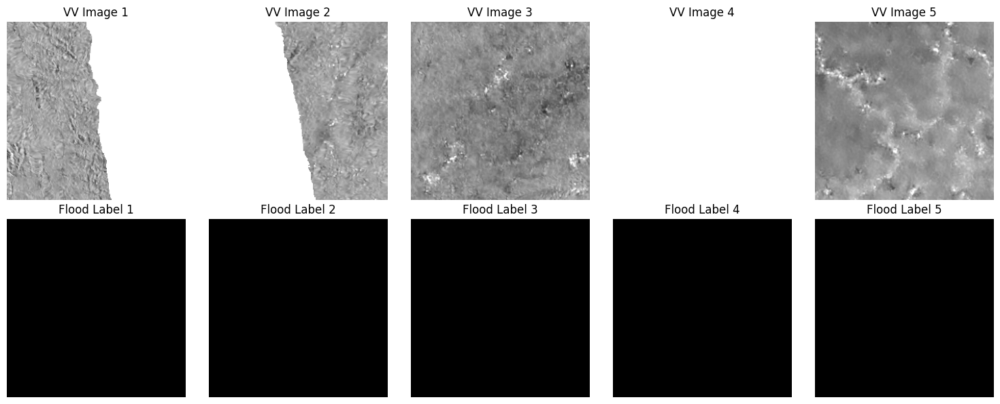

In [ ]:
import os
import numpy as np
import cv2
from glob import glob
import matplotlib.pyplot as plt
import random
from sklearn.model_selection import train_test_split

print(os.path.exists("/root/.cache/kagglehub/datasets/samvram/sarfloodsegmentation/versions/1"))


def create_dir(path):
    if not os.path.exists(path):
        os.makedirs(path)

def load_dataset(train_size=1000, test_size=200, valid_size=200, split=0.1):
    """ Loading the images and masks """
    # Get all VV image paths
    X = sorted(glob("/root/.cache/kagglehub/datasets/samvram/sarfloodsegmentation/versions/1/train/train/*/*/vv/*.png"))
    print(X)
    # Create a matching list of mask paths
    Y = []
    for vv_path in X:
        # Extract the filename
        vv_filename = os.path.basename(vv_path)

        # Construct the corresponding mask path
        mask_path = vv_path.replace('/vv/', '/flood_label/').replace('_vv.png', '.png')
        Y.append(mask_path)

    # Truncate to desired dataset size
    X = X[:train_size + test_size + valid_size]
    Y = Y[:train_size + test_size + valid_size]


    """ Splitting the data into training and testing """
    split_size = int(len(X) * split)
    train_x, valid_x = train_test_split(X, test_size=split_size, random_state=42)
    train_y, valid_y = train_test_split(Y, test_size=split_size, random_state=42)
    train_x, test_x = train_test_split(train_x, test_size=split_size, random_state=42)
    train_y, test_y = train_test_split(train_y, test_size=split_size, random_state=42)

    return (train_x, train_y), (valid_x, valid_y), (test_x, test_y)

def load_and_preprocess_image(image_path, mask_path):
    """
    Load and preprocess both image and mask with error handling
    """
    # Read VV image
    img = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
    if img is None:
        print(f"Error: Could not read image {image_path}")
        return None, None

    # Read corresponding mask
    mask = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)
    if mask is None:
        print(f"Error: Could not read mask {mask_path}")
        return None, None

    # Resize images
    try:
        img_resized = cv2.resize(img, (256, 256))
        mask_resized = cv2.resize(mask, (256, 256))
        return img_resized, mask_resized
    except Exception as e:
        print(f"Error resizing images: {e}")
        print(f"Image shape: {img.shape}, Mask shape: {mask.shape}")
        return None, None

def visualize_sample_data(data_x, data_y, num_samples=5):
    """ Visualize sample images and masks with random selection """
    # Randomly select indices
    sample_indices = random.sample(range(len(data_x)), min(num_samples, len(data_x)))

    # Create figure with subplots
    fig, axes = plt.subplots(2, num_samples, figsize=(15, 6))

    valid_samples = 0
    for i, idx in enumerate(sample_indices):
        # Load and preprocess images
        img, mask = load_and_preprocess_image(data_x[idx], data_y[idx])

        if img is None or mask is None:
            print(f"Skipping sample {idx}")
            continue

        # Plot VV image
        axes[0, valid_samples].imshow(img, cmap='gray')
        axes[0, valid_samples].set_title(f'VV Image {valid_samples+1}')
        axes[0, valid_samples].axis('off')

        # Plot mask
        axes[1, valid_samples].imshow(mask, cmap='gray')
        axes[1, valid_samples].set_title(f'Flood Label {valid_samples+1}')
        axes[1, valid_samples].axis('off')

        valid_samples += 1

        # Break if we've plotted enough valid samples
        if valid_samples >= num_samples:
            break

    plt.tight_layout()
    plt.show()

def main_visualization():
    """ Main function to load and visualize data """
    # Create directories
    create_dir("files")

    # Load dataset
    (train_x, train_y), _, _ = load_dataset()

    # Print out some diagnostic information
    print(f"Total number of images: {len(train_x)}")
    print("Sample image paths:")
    for x, y in zip(train_x[:5], train_y[:5]):
        print(f"VV Image: {x}")
        print(f"Mask: {y}")
        print("---")

    # Visualize sample data
    visualize_sample_data(train_x, train_y)

if __name__ == "__main__":
    main_visualization()

In [ ]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"

import numpy as np
import cv2
from glob import glob
from sklearn.utils import shuffle
import tensorflow as tf
from keras.callbacks import ModelCheckpoint, CSVLogger, ReduceLROnPlateau, EarlyStopping
from keras.optimizers import Adam, SGD
from sklearn.model_selection import train_test_split
from patchify import patchify

""" UNETR Configuration """
cf = {}
cf["image_size"] = 256
cf["num_channels"] = 3
cf["num_layers"] = 12
cf["hidden_dim"] = 128
cf["mlp_dim"] = 32
cf["num_heads"] = 6
cf["dropout_rate"] = 0.1
cf["patch_size"] = 16
cf["num_patches"] = (cf["image_size"]**2)//(cf["patch_size"]**2)
cf["flat_patches_shape"] = (
    cf["num_patches"],
    cf["patch_size"]*cf["patch_size"]*cf["num_channels"]
)

def read_image(path):
    path = path.decode()
    image = cv2.imread(path, cv2.IMREAD_COLOR)
    image = cv2.resize(image, (cf["image_size"], cf["image_size"]))
    image = image / 255.0

    """ Processing to patches """
    patch_shape = (cf["patch_size"], cf["patch_size"], cf["num_channels"])
    patches = patchify(image, patch_shape, cf["patch_size"])
    patches = np.reshape(patches, cf["flat_patches_shape"])
    patches = patches.astype(np.float32)

    return patches

def read_mask(path):
    path = path.decode()
    mask = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, (cf["image_size"], cf["image_size"]))
    mask = mask / 255.0
    mask = mask.astype(np.float32)
    mask = np.expand_dims(mask, axis=-1)
    return mask

def augment_data(image, mask):
    # Random flip
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_left_right(image)
        mask = tf.image.flip_left_right(mask)
    return image, mask

def tf_parse(x, y):
    def _parse(x, y):
        x = read_image(x)
        y = read_mask(y)
        return x, y

    x, y = tf.numpy_function(_parse, [x, y], [tf.float32, tf.float32])
    x.set_shape(cf["flat_patches_shape"])
    y.set_shape([cf["image_size"], cf["image_size"], 1])
    return x, y

def tf_dataset(X, Y, batch=2, is_training=False):
    ds = tf.data.Dataset.from_tensor_slices((X, Y))
    ds = ds.map(tf_parse)
    if is_training:
        ds = ds.map(augment_data)
        ds = ds.shuffle(buffer_size=1000)
    ds = ds.batch(batch).prefetch(tf.data.AUTOTUNE)
    return ds

if __name__ == "__main__":
    """ Seeding """
    np.random.seed(42)
    tf.random.set_seed(42)

    """ Directory for storing files """
    create_dir("files")

    """ Hyperparameters """
    batch_size = 8
    lr = 0.01
    num_epochs = 100
    model_path = os.path.join("files", "model.keras")
    csv_path = os.path.join("files", "log.csv")

    """ Dataset """
    (train_x, train_y), (valid_x, valid_y), (test_x, test_y) = load_dataset()

    print(f"Train: \t{len(train_x)} - {len(train_y)}")
    print(f"Valid: \t{len(valid_x)} - {len(valid_y)}")
    print(f"Test: \t{len(test_x)} - {len(test_y)}")

    train_dataset = tf_dataset(train_x, train_y, batch=batch_size)
    valid_dataset = tf_dataset(valid_x, valid_y, batch=batch_size)

    """ Model """
    model = build_unetr_2d(cf)
    model.compile(
        loss=focal_dice_loss,
        optimizer=Adam(learning_rate=0.001),
        metrics=[
            dice_coef,
            iou,
            "acc",
            sensitivity,
            precision
        ]
    )
    # model.summary()

    reduce_lr = ReduceLROnPlateau(
      monitor='val_dice_coef',  # Changed from val_loss
      factor=0.2,
      patience=5,
      min_lr=1e-6,
      verbose=1
  )

    callbacks = [
        ModelCheckpoint(
            model_path,
            monitor='val_dice_coef',  # Changed from val_loss
            mode='max',  # Changed from 'min'
            verbose=1,
            save_best_only=True
        ),
        reduce_lr,
        CSVLogger(csv_path),
        EarlyStopping(
            monitor='val_dice_coef',
            mode='max',
            patience=15,
            restore_best_weights=True
        )
    ]
    model.fit(
        train_dataset,
        epochs=num_epochs,
        validation_data=valid_dataset,
        callbacks=callbacks
    )

['/root/.cache/kagglehub/datasets/samvram/sarfloodsegmentation/versions/1/train/train/bangladesh_20170314t115609/tiles/vv/bangladesh_20170314t115609_x-0_y-0_vv.png', '/root/.cache/kagglehub/datasets/samvram/sarfloodsegmentation/versions/1/train/train/bangladesh_20170314t115609/tiles/vv/bangladesh_20170314t115609_x-0_y-10_vv.png', '/root/.cache/kagglehub/datasets/samvram/sarfloodsegmentation/versions/1/train/train/bangladesh_20170314t115609/tiles/vv/bangladesh_20170314t115609_x-0_y-11_vv.png', '/root/.cache/kagglehub/datasets/samvram/sarfloodsegmentation/versions/1/train/train/bangladesh_20170314t115609/tiles/vv/bangladesh_20170314t115609_x-0_y-12_vv.png', '/root/.cache/kagglehub/datasets/samvram/sarfloodsegmentation/versions/1/train/train/bangladesh_20170314t115609/tiles/vv/bangladesh_20170314t115609_x-0_y-13_vv.png', '/root/.cache/kagglehub/datasets/samvram/sarfloodsegmentation/versions/1/train/train/bangladesh_20170314t115609/tiles/vv/bangladesh_20170314t115609_x-0_y-14_vv.png', '/ro